### Experiments setup

In [1]:
from sksurv.ensemble import RandomSurvivalForest
from pycox import datasets
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import KaplanMeierFitter
from matplotlib.colors import ListedColormap

import warnings
warnings.filterwarnings('ignore')

In [2]:
# read text file into pandas DataFrame
data = pd.read_csv("preprocessed_data.csv")

In [3]:
data.head()

,years_to_birth,pathologic_stage,gender,radiation_therapy,number_of_lymph_nodes,race,ABCA1,ABHD11,ACADSB,ACAN,...,WDR93,WNT3A,XBP1,XKRX,ZMYND10,ZNF385B,ZNF552,ZP1,surv_time,surv_indicator
0,66.0,stage 1,female,yes,0.0,white,3.191494,3.608185,3.762767,2.009767,...,1.961230,0.391631,5.482462,1.047873,2.959232,2.326044,3.496123,0.474824,4354.0,0.0
1,36.0,stage 3,female,yes,18.0,black or african american,2.804341,3.865520,2.659842,2.652168,...,1.114943,0.355813,4.194310,1.371155,0.819440,1.462518,3.064512,0.355813,548.0,1.0
2,48.0,stage 1,female,no,0.0,white,3.466361,3.484649,3.224694,2.132669,...,1.011178,0.384359,4.682459,1.182371,1.523545,1.902937,2.997846,0.000000,2385.0,0.0
3,36.0,stage 1,female,yes,0.0,black or african american,2.905381,3.505458,3.859831,1.358227,...,1.171753,0.000000,5.568837,0.930744,2.785170,1.909439,3.747712,0.272440,3709.0,0.0
4,62.0,stage 2,female,yes,0.0,white,3.191566,3.513334,3.002457,2.464913,...,1.170369,0.000000,4.127066,1.595203,1.426612,1.534408,2.606274,0.149200,2246.0,0.0


In [4]:
# Extract dataset
feat_cols = np.array([col for col in data.columns.values if col not in ["surv_time", "surv_indicator"]])
feats = data[feat_cols]
surv_label_df = data[["surv_time", "surv_indicator"]]
surv_label = surv_label_df.values
surv_times, surv_inds = surv_label[:, 0], surv_label[:, 1]

### Survival label Analysis

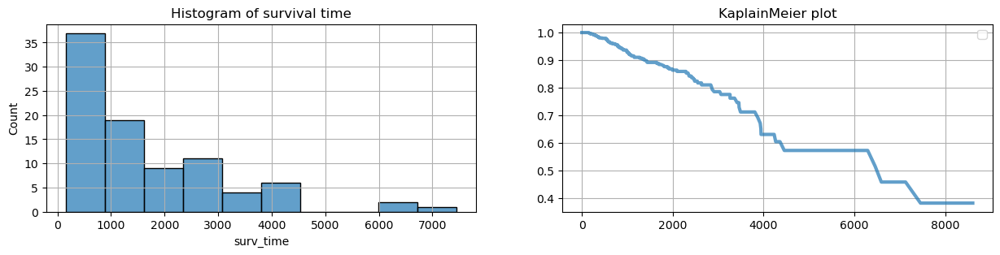

In [6]:
_, ax = plt.subplots(1, 2, figsize=(15, 3))

# Plot the hist plot
sns.histplot(data=surv_label_df[surv_label_df.surv_indicator == 1], x = 'surv_time', ax=ax[0], alpha=0.7)
ax[0].grid()
ax[0].set_title("Histogram of survival time")

# Plot the KaplainMeier plot
ax[1].grid()
ax[1].set_title("KaplainMeier plot")

kmf = KaplanMeierFitter()
kmf.fit(surv_times, surv_inds, label='kmf')
time = kmf.survival_function_.index.values
mean = kmf.survival_function_['kmf'].values
ax[1].plot(time, mean, linewidth=3, alpha=0.7)
ax[1].legend()
plt.show()

In [7]:
print("Censoring percentage {:.2f} %".format(100 * (1 - (sum(surv_inds) / len(surv_inds)))))

Censoring percentage 89.40 %


### Feature Analysis

In [9]:
feats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Columns: 179 entries, years_to_birth to ZP1
dtypes: float64(175), object(4)
memory usage: 1.1+ MB


In [10]:
# Split numerical and categorical features
numeric_feat_cols = feats.select_dtypes(include=[np.dtype('int64'), np.dtype('float64')]).columns.tolist()
cate_feat_cols = [col for col in feat_cols if col not in numeric_feat_cols]

#### Categorical features

In [12]:
def plot_count_kmf(featuresDF, surv_labels):
    """Plot count plot and KaplainMeier plot for categorical or ordinal features.
    
    Parameters
    ----------
    featureDF: pandas DataFrame
        The dataframe contains the set of features
    targetDF: pandas DataFrame
        The dataframe contains the corresponding target (saleprice)
    """
    # Visualize the distribution of categorical features
    for featureName in featuresDF.columns:
        feat_df = featuresDF[featureName]
        feat_values = feat_df.drop_duplicates().values
        palette = {}
        for i in range(len(feat_values)):
            palette[feat_values[i]] = sns.color_palette('colorblind')[i]
        #print(palette)
        #sns.set_palette(palette)
        _, ax = plt.subplots(1, 2, figsize=(15, 3))

        # Plot the count plot
        sns.countplot(data=featuresDF, x = featureName, hue = featureName, ax=ax[0], alpha=0.7, palette=palette)
        ax[0].grid()
        ax[0].set_title("Count plot")

        # Plot the strip plot
        #sns.violinplot(x=featuresDF[featureName], y=targetDF.SalePrice,  ax=ax[1])

        surv_times, surv_inds = surv_labels[:, 0], surv_labels[:, 1]
        ax[1].grid()
        ax[1].set_title("KaplainMeier plot")
        
        kmf = KaplanMeierFitter()
        for i in range(len(feat_values)):
            value = feat_values[i]
            kmf.fit(surv_times[feat_df.values == value], surv_inds[feat_df.values == value], label=value)
            time = kmf.survival_function_.index.values
            mean = kmf.survival_function_[value].values
            ax[1].plot(time, mean, linewidth=3, color=palette[value], label=value, alpha=0.7)
        ax[1].legend()


        # Adjust the orientation of the names in x-axis to avoid overlapping
        #if len(plt.xticks()[1]) >= 5:
            #ax[0].set_xticklabels(labels=plt.xticks()[1], rotation=70)
            #ax[1].set_xticklabels(labels=plt.xticks()[1], rotation=70)

        # Add the title
        plt.suptitle(featureName, weight="semibold")

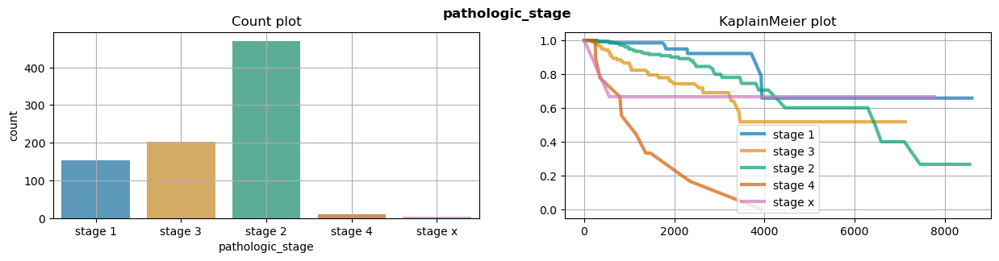

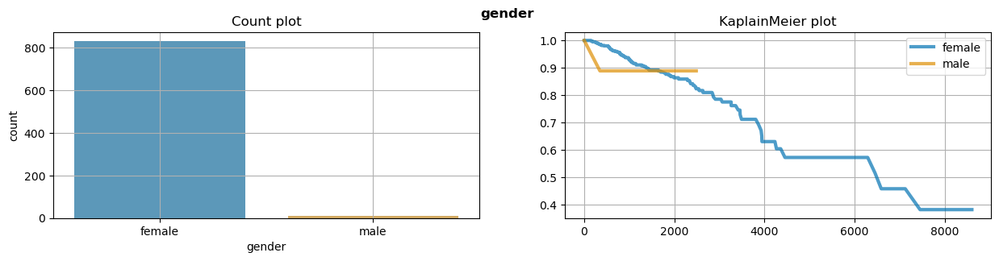

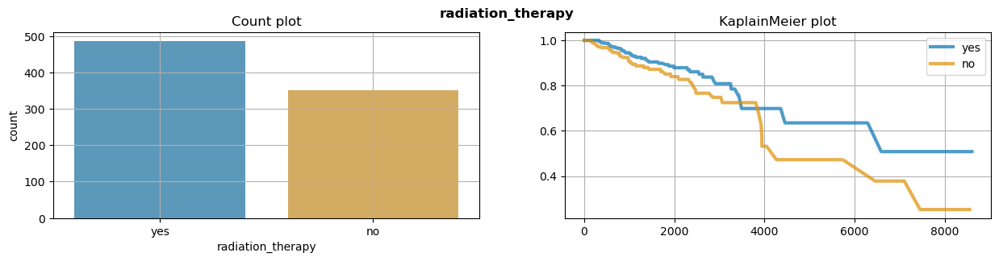

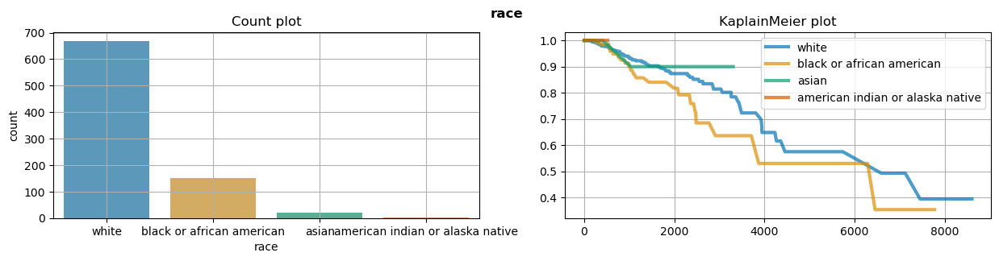

In [22]:
plot_count_kmf(feats[cate_feat_cols], surv_label)

#### Numerical features

In [25]:
var_df = pd.DataFrame(feats[numeric_feat_cols].var().T, columns=['value'])
var_df.sort_values(by='value', ascending=False).head(20)
numeric_feat_cols = var_df[var_df.value != 0].index.values.tolist()
feat_cols = [col for col in feat_cols if col in numeric_feat_cols + cate_feat_cols]
feats = feats[feat_cols]

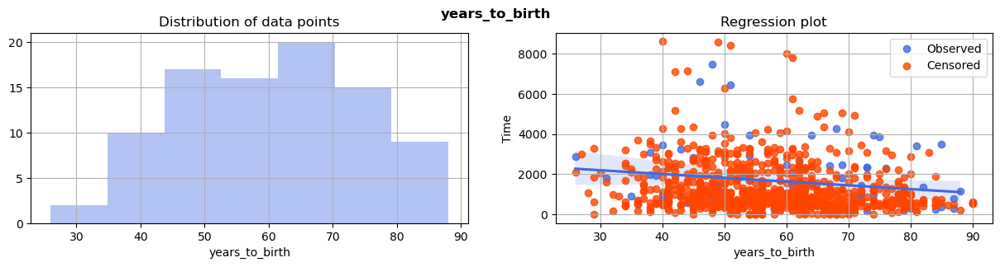

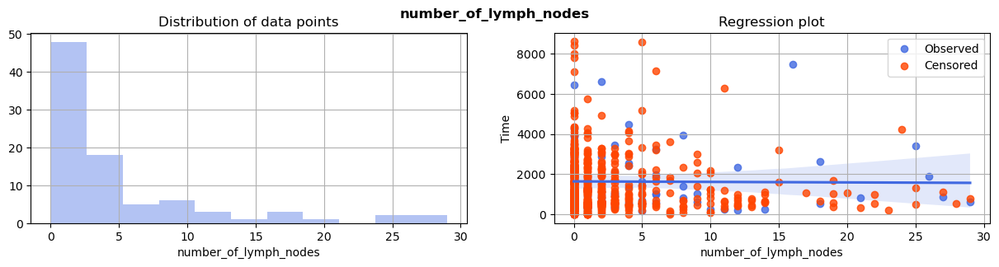

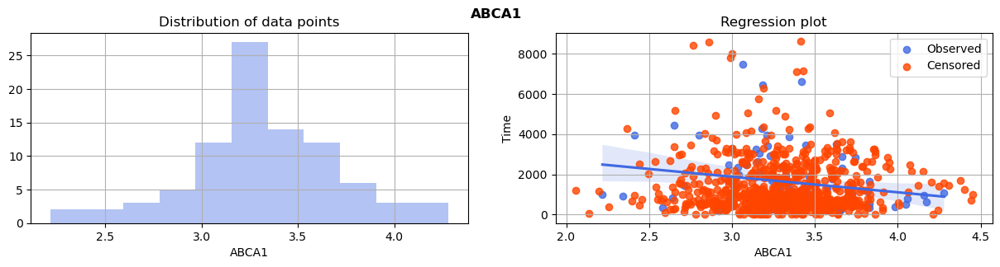

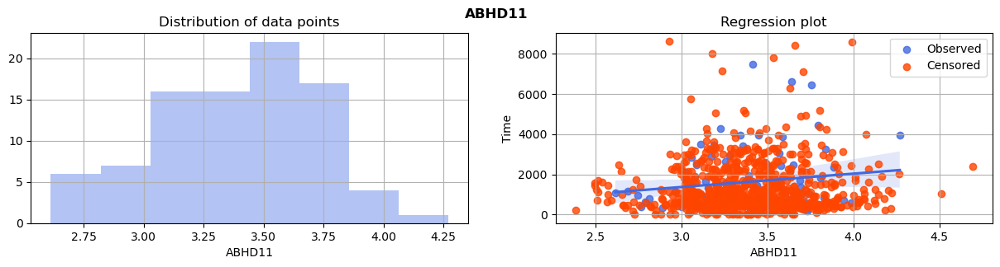

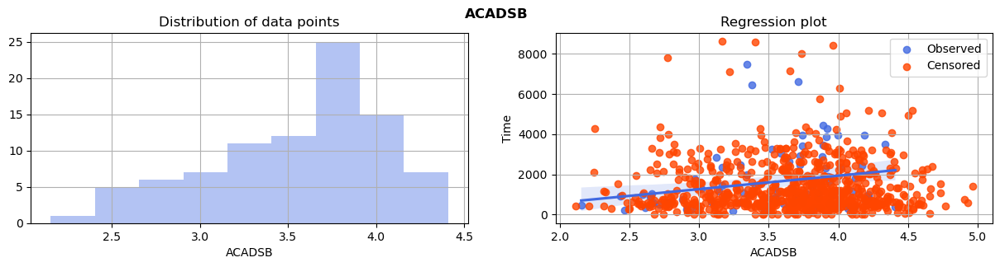

...

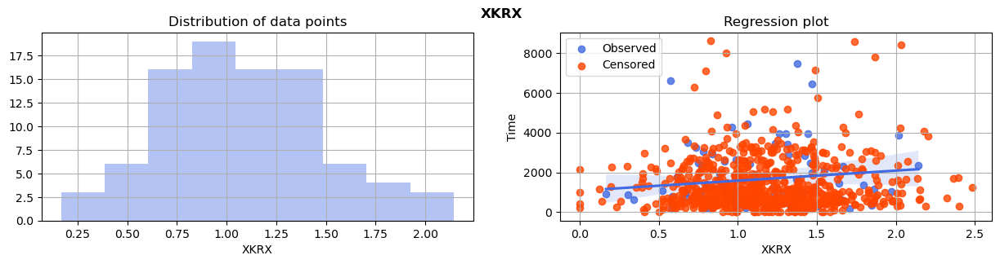

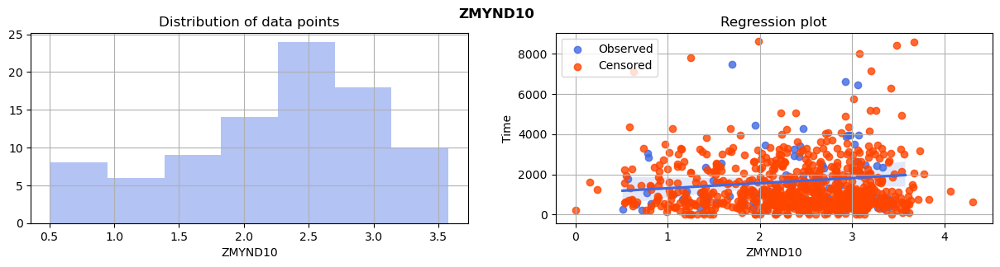

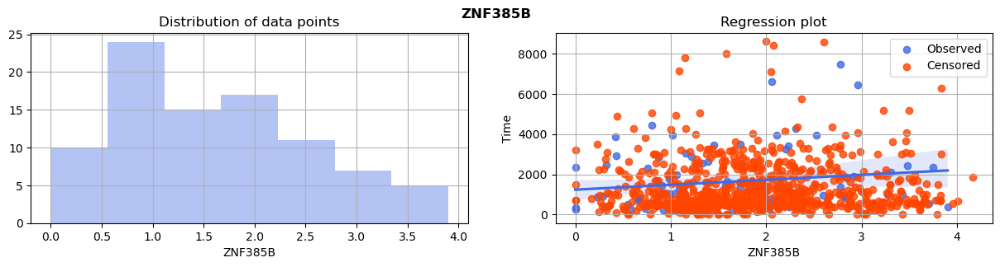

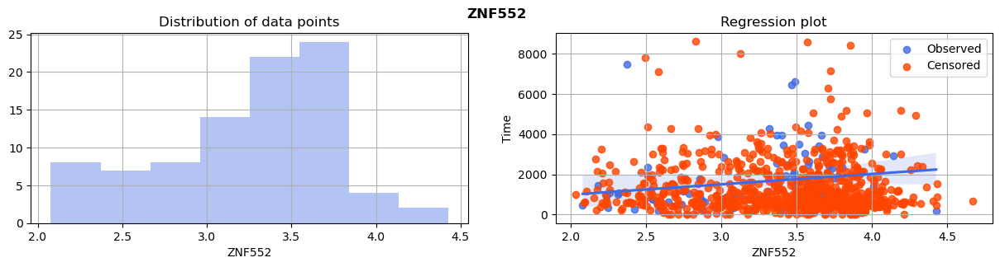

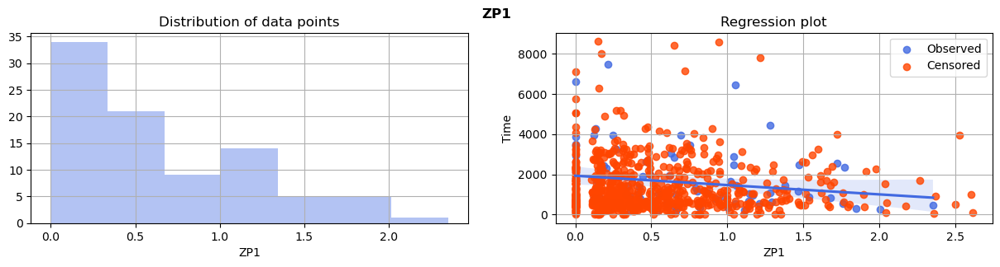

In [27]:
# Visualize only non-missing features
numericalFeaturesDF = feats[numeric_feat_cols]
for featureName in numericalFeaturesDF.columns:
    _, ax = plt.subplots(1, 2, figsize=(15, 3))
    
    # Plot the distribution
    sns.distplot(numericalFeaturesDF[featureName][surv_inds==1], 
                 kde=False, ax=ax[0], color="royalblue")
    ax[0].grid()
    ax[0].set_title("Distribution of data points")
    
    # Plot the regression line in a scatter plot
    sns.regplot(x=numericalFeaturesDF[featureName][surv_inds==1], y=surv_times[surv_inds==1], 
                ax=ax[1], color="royalblue", label="Observed")
    sns.regplot(x=numericalFeaturesDF[featureName][surv_inds==0], y=surv_times[surv_inds==0], 
                ax=ax[1], color="orangered", label="Censored", fit_reg=False)
    ax[1].grid()
    ax[1].set_title("Regression plot")
    ax[1].set_ylabel("Time")
    ax[1].legend()
    
    # Add the title
    plt.suptitle(featureName, weight="semibold")

### Feature preprocessing

In [29]:
# Encode categorical features
from sklearn.preprocessing import OneHotEncoder
feats_new = feats[numeric_feat_cols]
feat_enc_cols = []
enc_dict = {}
for feat_col in cate_feat_cols:
    enc = OneHotEncoder(drop='first')
    feat_new = enc.fit_transform(feats[feat_col].values.reshape((-1, 1))).toarray()
    feat_col_new = enc.get_feature_names_out([feat_col]).tolist()
    feats_new[feat_col_new] = feat_new
    feat_enc_cols.append(feat_col_new)
    enc_dict[feat_col] = enc
    
feats = feats_new
feat_cols = feats.columns.values

In [30]:
# Survival model to be explained
surv_label_structarray = []
for i in range(surv_label.shape[0]):
    surv_label_structarray.append((bool(surv_label[i, 1]), surv_label[i, 0]))

surv_label_structarray = np.rec.array(surv_label_structarray, dtype=[('indicator', bool), ('time', np.float32)])
estimator = RandomSurvivalForest(random_state=1).fit(feats.values.astype(float), surv_label_structarray)

In [31]:
# Load model explainer
from src.explainer import explainer
eval_times = np.unique(surv_label[:, 0][surv_label[:, 1]==1])[:-1:5]
model_explainer = explainer(estimator, feats, surv_label, 
                            encoders=enc_dict, times=eval_times)

### Prediction

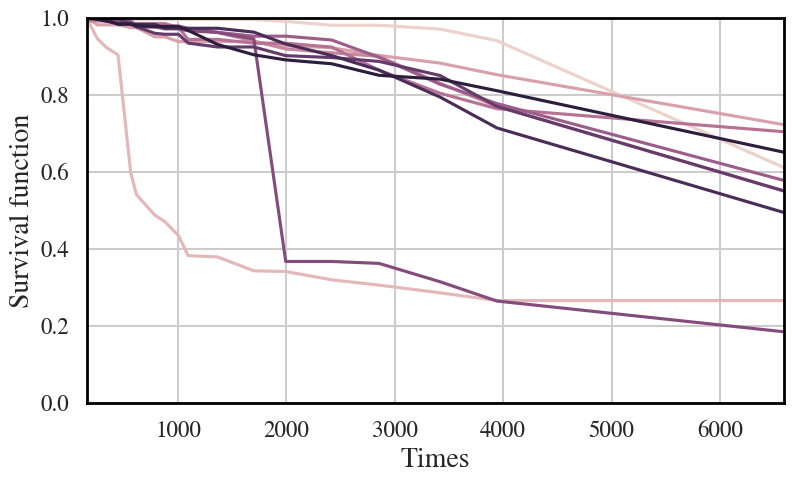

In [33]:
from src import prediction
# select first 10 observations to be explained
explained_data = feats[:10]
# Survival prediction
surv_pred = prediction.predict(model_explainer, explained_data, eval_times)
prediction.plot_prediction(surv_pred, "survival")

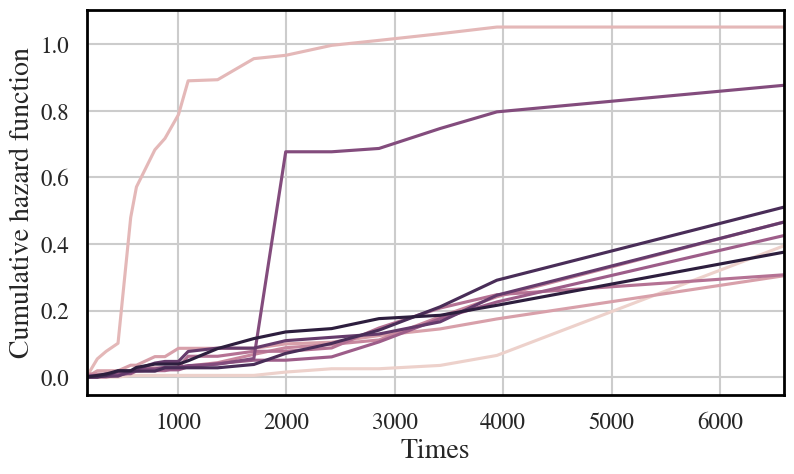

In [34]:
# Cumulative hazard prediction
chf_pred = prediction.predict(model_explainer, explained_data, eval_times, prediction_type="chf")
prediction.plot_prediction(chf_pred, "chf")

### Performance

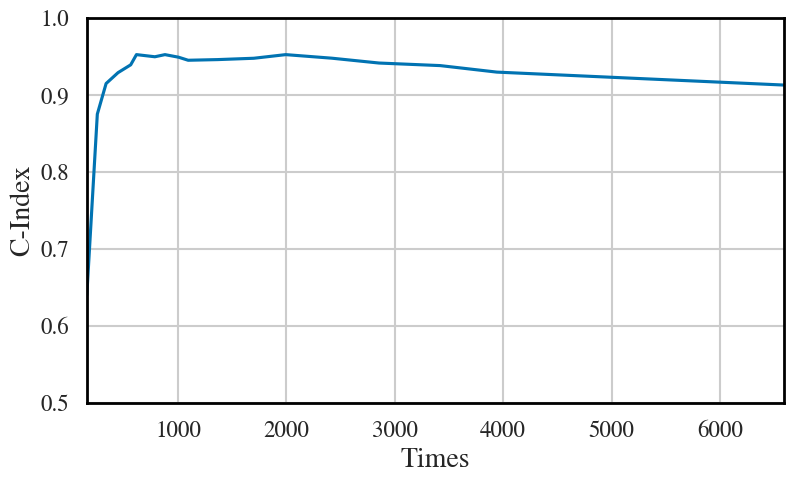

In [36]:
from src import performance
# C-Index evaluation
cindex_perf = performance.evaluate(model_explainer, feats, surv_label, metric="c_index")
performance.plot_performance(cindex_perf, metric="c_index", ylim=(0.5, 1.0))

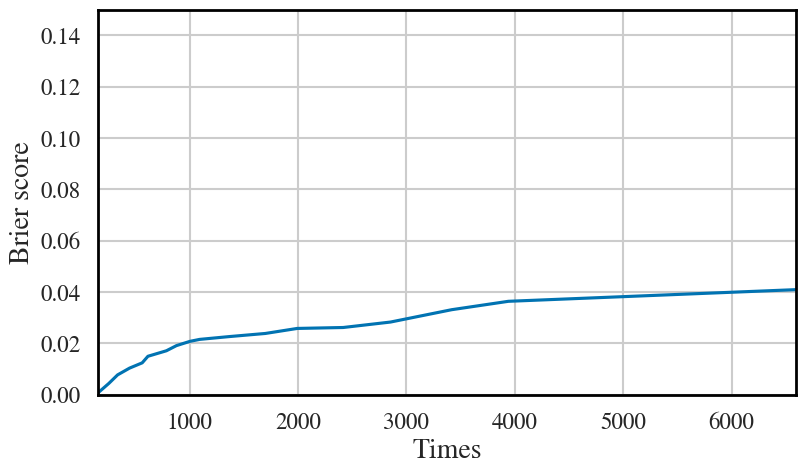

In [37]:
# Brier score evaluation
bs_perf = performance.evaluate(model_explainer, feats, surv_label, times=eval_times, metric="brier_score")
performance.plot_performance(bs_perf, metric="brier_score", ylim=(0,0.15))

### Local explaination

In [39]:
from src import local_explaination

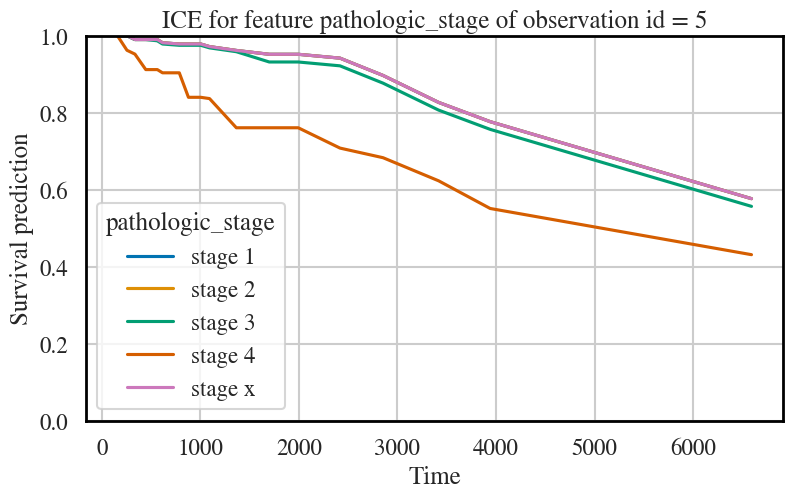

In [40]:
# individual conditional expectation
explained_feature_name = "pathologic_stage"
ICE_df = local_explaination.individual_conditional_expectation(model_explainer, 
                                                               explained_feature_name, 
                                                               num_samples=10, 
                                                               num_grid_points=10)
local_explaination.plot_ice(model_explainer, ICE_df, sample_id=5)

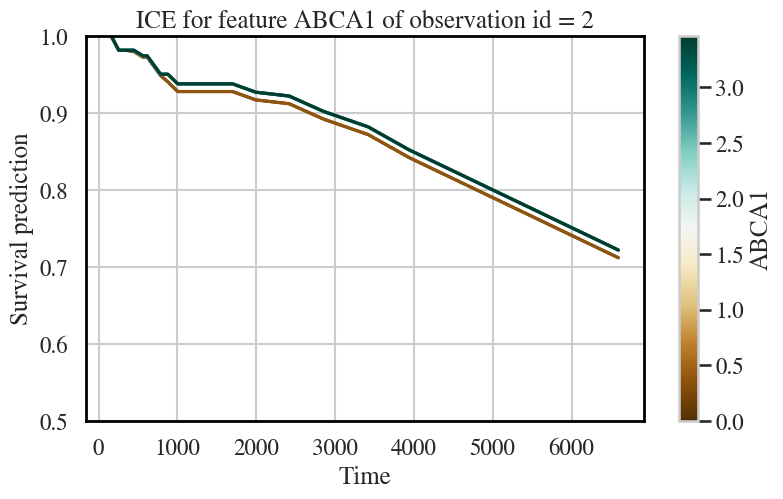

In [41]:
# individual conditional expectation
explained_feature_name = "ABCA1"
ICE_df = local_explaination.individual_conditional_expectation(model_explainer, 
                                                               explained_feature_name, 
                                                               num_samples=10, 
                                                               num_grid_points=10)
local_explaination.plot_ice(model_explainer, ICE_df, sample_id=2, ylim=[0.5, 1])

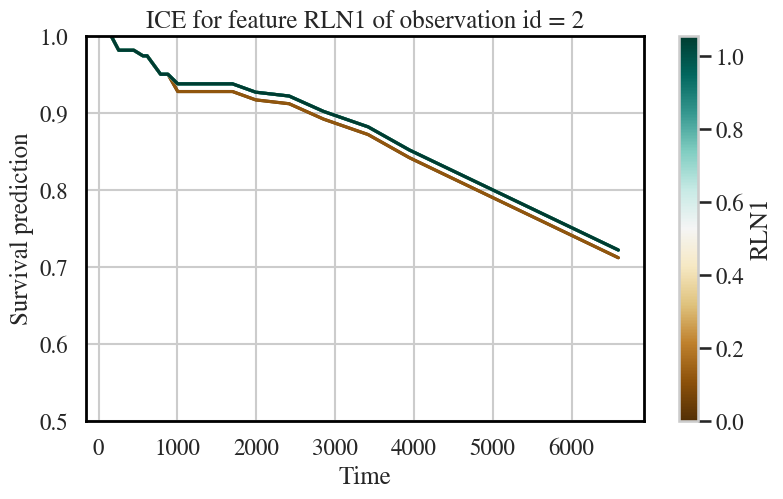

In [42]:
# individual conditional expectation
explained_feature_name = "RLN1"
ICE_df = local_explaination.individual_conditional_expectation(model_explainer, 
                                                               explained_feature_name, 
                                                               num_samples=10, 
                                                               num_grid_points=10)
local_explaination.plot_ice(model_explainer, ICE_df, sample_id=2, ylim=[0.5, 1])

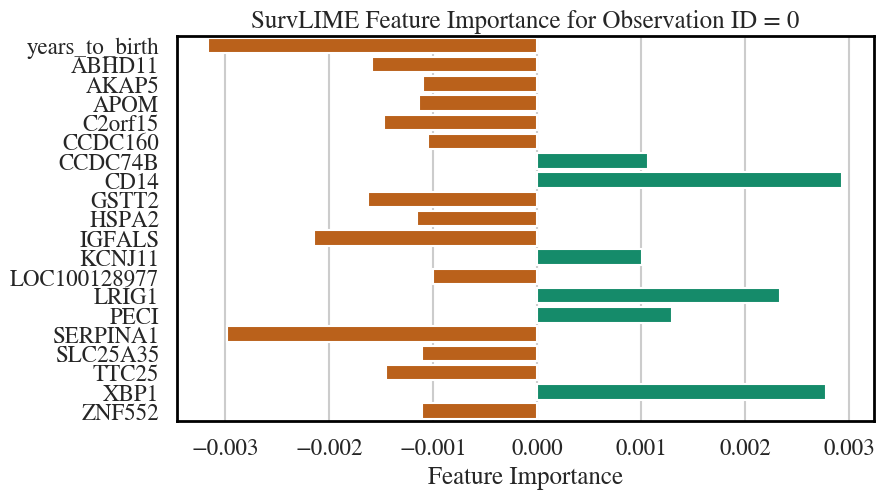

In [71]:
# SurvLIME
sample_id = 0
SurvLIME_df = local_explaination.survlime(model_explainer, explained_data, sample_id=sample_id)
SurvLIME_df_ext = SurvLIME_df.copy(deep=True)
SurvLIME_df_ext["Feature Importance Abs"] = np.abs(SurvLIME_df_ext["Feature Importance"].values)
sorted_SurvLIME_df = SurvLIME_df_ext.sort_values("Feature Importance Abs", ascending=False)
most_fi_names = sorted_SurvLIME_df.head(20).Feature.values
most_SurvLIME_df = SurvLIME_df[SurvLIME_df.Feature.isin(most_fi_names)]

local_explaination.plot_survlime(most_SurvLIME_df, sample_id=sample_id)

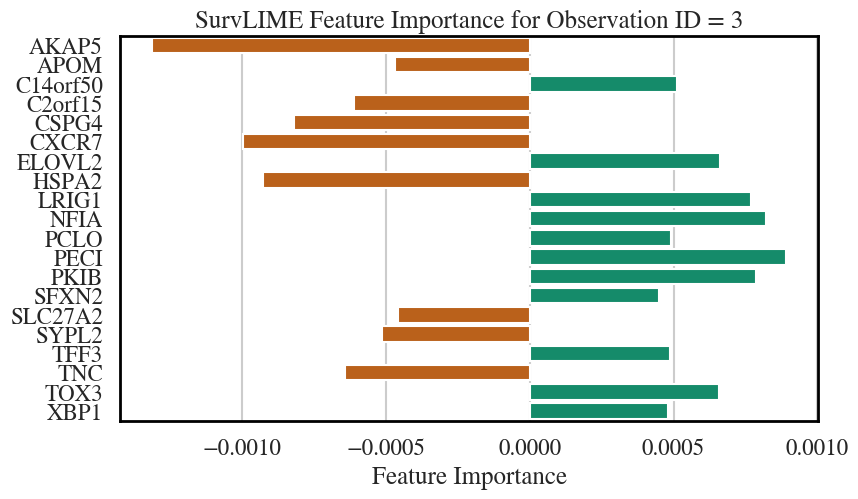

In [85]:
# SurvLIME
sample_id = 3
SurvLIME_df = local_explaination.survlime(model_explainer, explained_data, sample_id=sample_id)
SurvLIME_df_ext = SurvLIME_df.copy(deep=True)
SurvLIME_df_ext["Feature Importance Abs"] = np.abs(SurvLIME_df_ext["Feature Importance"].values)
sorted_SurvLIME_df = SurvLIME_df_ext.sort_values("Feature Importance Abs", ascending=False)
most_fi_names = sorted_SurvLIME_df.head(20).Feature.values
most_SurvLIME_df = SurvLIME_df[SurvLIME_df.Feature.isin(most_fi_names)]

local_explaination.plot_survlime(most_SurvLIME_df, sample_id=sample_id)

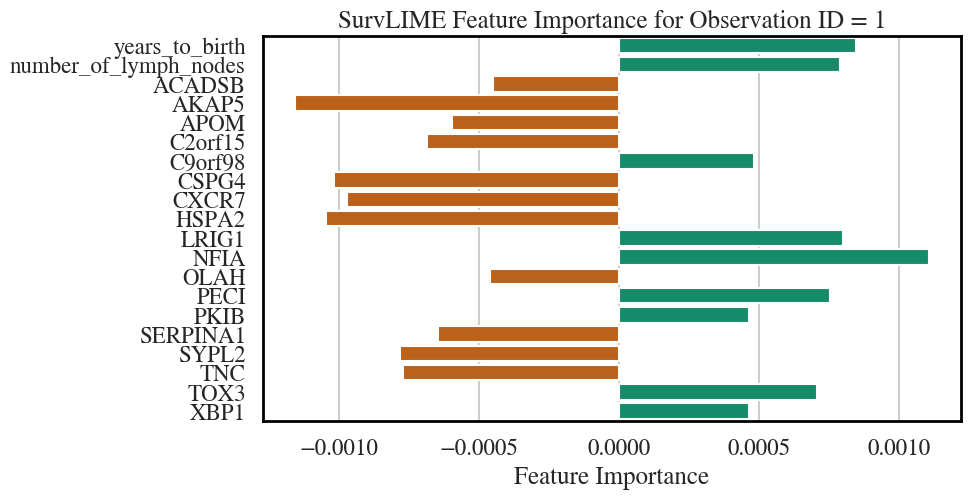

In [87]:
# SurvLIME
sample_id = 1
SurvLIME_df = local_explaination.survlime(model_explainer, explained_data, sample_id=sample_id)
SurvLIME_df_ext = SurvLIME_df.copy(deep=True)
SurvLIME_df_ext["Feature Importance Abs"] = np.abs(SurvLIME_df_ext["Feature Importance"].values)
sorted_SurvLIME_df = SurvLIME_df_ext.sort_values("Feature Importance Abs", ascending=False)
most_fi_names = sorted_SurvLIME_df.head(20).Feature.values
most_SurvLIME_df = SurvLIME_df[SurvLIME_df.Feature.isin(most_fi_names)]

local_explaination.plot_survlime(most_SurvLIME_df, sample_id=sample_id)

### Global explaination

In [57]:
from src import global_explaination

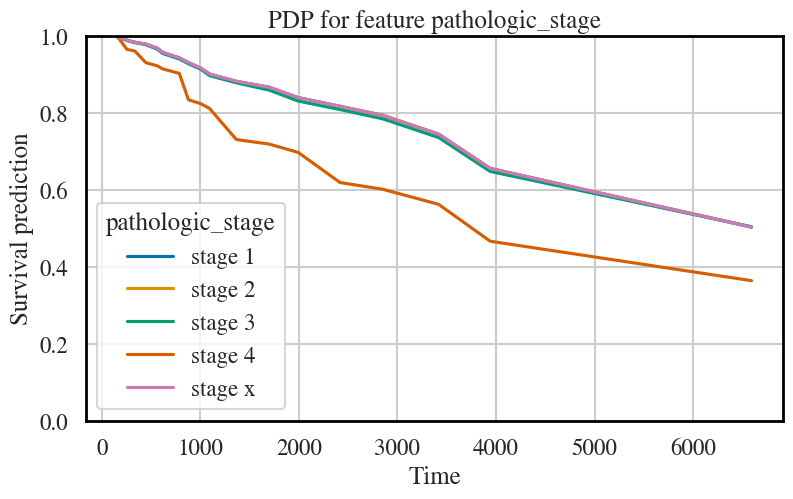

In [58]:
# partial dependence plot
explained_feature_name = "pathologic_stage"
pdp_res_df = global_explaination.partial_dependence_plots(model_explainer, explained_feature_name, num_samples=100)
global_explaination.plot_pdp(model_explainer, pdp_res_df)

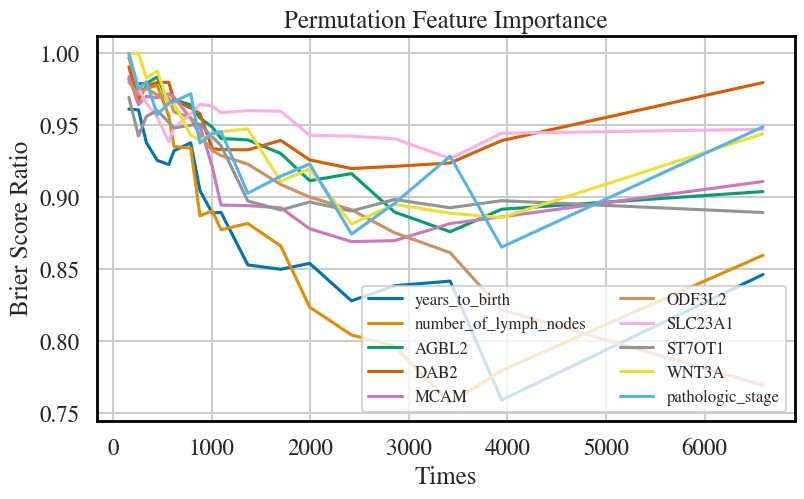

In [59]:
# permuatation feature importance
feat_importance_df = global_explaination.permutation_feature_importance(model_explainer, num_perm = 3)
sorted_fi_mean_df = feat_importance_df.groupby(by="feat").mean().reset_index()[["feat", "perf"]].sort_values("perf", ascending=False)
least_fi_names = sorted_fi_mean_df[sorted_fi_mean_df.perf > .999].feat.values
most_fi_names = sorted_fi_mean_df.tail(10).feat.values
most_feat_importance_df = feat_importance_df[feat_importance_df.feat.isin(most_fi_names)]
least_feat_importance_df = feat_importance_df[feat_importance_df.feat.isin(least_fi_names)]
global_explaination.plot_pfi(most_feat_importance_df, output_type="ratio")